<a href="https://colab.research.google.com/github/laurenneal/capstone-visual-neuroscience/blob/Dylan/demo_pipeline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<html><head><meta content="text/html; charset=UTF-8" http-equiv="content-type"><style type="text/css">ol</style></head><body class="c5"><p class="c0 c4"><span class="c3"></span></p><p class="c2 title" id="h.rrbabt268i6e"><h1>CaImAn&rsquo;s Demo pipeline</h1></p><p class="c0"><span class="c3">This notebook will help to demonstrate the process of CaImAn and how it uses different functions to denoise, deconvolve and demix neurons from a two-photon Calcium Imaging dataset. The demo shows how to construct the `params`, `MotionCorrect` and `cnmf` objects and call the relevant functions. You can also run a large part of the pipeline with a single method (`cnmf.fit_file`). See inside for details.

Dataset couresy of Sue Ann Koay and David Tank (Princeton University)

This demo pertains to two photon data. For a complete analysis pipeline for one photon microendoscopic data see demo_pipeline_cnmfE.ipynb</span></p>
<p><img src="https://raw.githubusercontent.com/flatironinstitute/CaImAn/master/docs/img/quickintro.png" /></p>
<p class="c0"><span class="c3">More information can be found in the companion paper. </span></p>
</html>



In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# Clone CaImAn from Github
!git clone https://github.com/flatironinstitute/CaImAn.git

fatal: destination path 'CaImAn' already exists and is not an empty directory.


In [3]:
# Install relevant packages
%cd /content/CaImAn
!pip install -r requirements.txt

/content/CaImAn


In [4]:
# Install CaImAn package
!pip install -e . 

Obtaining file:///content/CaImAn
  Attempting uninstall: caiman
    Found existing installation: caiman 1.9.5
    Can't uninstall 'caiman'. No files were found to uninstall.
  Running setup.py develop for caiman


In [5]:
#!git checkout e695785
# Install CaImAn manager for relevant datasets
!python caimanmanager.py install --inplace

Traceback (most recent call last):
  File "caimanmanager.py", line 276, in <module>
    main()
  File "caimanmanager.py", line 234, in main
    do_install_to(cfg.userdir, cfg.inplace, cfg.force)
  File "caimanmanager.py", line 57, in do_install_to
    raise Exception(targdir + " already exists. You may move it out of the way, remove it, or use --force")
Exception: /root/caiman_data already exists. You may move it out of the way, remove it, or use --force


In [6]:
# some imports 
import cv2
import glob
import logging
import matplotlib.pyplot as plt
import numpy as np
import imageio
from IPython.display import HTML
from base64 import b64encode
import os
try:
    cv2.setNumThreads(0)
except:
    pass

try:
    if __IPYTHON__:
        # this is used for debugging purposes only. allows to reload classes
        # when changed
        get_ipython().magic('load_ext autoreload')
        get_ipython().magic('autoreload 2')
except NameError:
    pass

import caiman as cm
from caiman.motion_correction import MotionCorrect
from caiman.source_extraction.cnmf import cnmf as cnmf
from caiman.source_extraction.cnmf import params as params
from caiman.utils.utils import download_demo
from caiman.utils.visualization import plot_contours, nb_view_patches, nb_plot_contour
from caiman.summary_images import local_correlations_movie_offline
from scipy.ndimage import center_of_mass
from IPython.display import display, clear_output

In [7]:
def plot_results(cnm_obj, num_traces = 10, time_int=0.5, indexes=None):
  if indexes is None:
    indexes = cnm_obj.estimates.idx_components
  indexes = np.random.permutation(indexes)[:num_traces]
  masks = np.reshape(cnm_obj.estimates.A.toarray(),cnm_obj.estimates.dims+(-1,), order='F').transpose([2,0,1])  
  masks = masks[indexes]
 
  C = cnm_obj.estimates.C[indexes]
  traces = C + cnm_obj.estimates.YrA[indexes]
  
  
  for i in range(masks.shape[0]):  
    # fig, axs = plt.subplots(1,2,figsize=(16,6))  
    fig = plt.figure(constrained_layout=True,figsize=(16,6))
    gs = fig.add_gridspec(1, 3)
    ax1 = fig.add_subplot(gs[:1])
    ax2 = fig.add_subplot(gs[1:])            
    ax1.imshow(masks[i])  
    plt.axis('off')     
    ax2.plot(traces[i], label='traces')
    ax2.plot(C[i], label='denoised')   
    display(fig)
    clear_output(wait=True)    
    plt.pause(time_int)
    
 

### Set up logger (optional)
You can log to a file using the filename parameter, or make the output more or less verbose by setting level to `logging.DEBUG`, `logging.INFO`, `logging.WARNING`, or `logging.ERROR`. A filename argument can also be passed to store the log file

In [8]:
logging.basicConfig(format= "%(relativeCreated)12d [%(filename)s:%(funcName)20s():%(lineno)s] [%(process)d] %(message)s",
                    # filename="/tmp/caiman.log",
                    level=logging.WARNING)

In [9]:
#testing path to mat file
!ls ../drive/MyDrive/DS6011_Capstone_VisualNeuroscience/DATA/stackraw_pmc_test.mat

../drive/MyDrive/DS6011_Capstone_VisualNeuroscience/DATA/stackraw_test.mat


### Select file(s) to be processed
The `download_demo` function will download the specific file for you and return the complete path to the file which will be stored in your `caiman_data` directory. If you adapt this demo for your data make sure to pass the complete path to your file(s). Remember to pass the `fname` variable as a list.

In [30]:
fnames = ['../drive/MyDrive/DS6011_Capstone_VisualNeuroscience/DATA/stackraw_pmc_test.mat']  # filename to be processed
#fnames = ['demoMovie.tif']
if fnames[0] in ['Sue_2x_3000_40_-46.tif', 'demoMovie.tif']:
    fnames = [download_demo(fnames[0])]

In [31]:
#testing output of download_demo method above, it just returns the path to this specific file
test = download_demo('demoMovie.tif',)

In [32]:
test

'/root/caiman_data/example_movies/demoMovie.tif'

In [33]:
#Using h5py to open nd explore a test raw stack
import h5py
stackRaw = h5py.File('../drive/MyDrive/DS6011_Capstone_VisualNeuroscience/DATA/stackraw_test.mat', 'r+')


In [36]:
stackRaw['stackRaw_mc']

<HDF5 dataset "stackRaw_mc": shape (5458, 256, 128), type "<f8">

In [37]:
#Use builtin caiman function to read array from .mat file
testmov = cm.base.movies.load(fnames, var_name_hdf5 = 'stackRaw_mc')

100%|██████████| 1/1 [00:06<00:00,  6.09s/it]


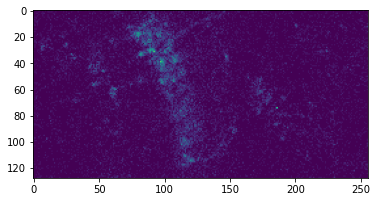

In [38]:
#visualize the first frame of the movie
import matplotlib.pyplot as plt
#.T is important to flip the axes back to original
plt.imshow(testmov[1000].T)

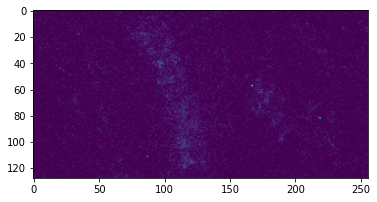

In [39]:
#numpy function to flip the x and y for whole movie array
flip = np.transpose(testmov, axes = (0,2,1))
plt.imshow(flip[0])

In [40]:
testmov = np.transpose(testmov, axes = (0,2,1))

100%|██████████| 1/1 [00:00<00:00, 17.81it/s]


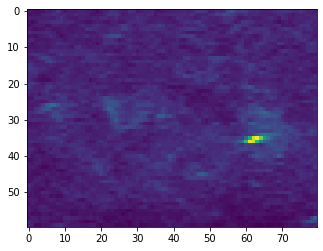

In [41]:
#first frame of movie file we know is in correct format from demo folder
testframe = cm.load_movie_chain([test])
plt.imshow(testframe[1000])

In [54]:
#Test to save the first 500 frames back to an h5 file to test with
h5f = h5py.File('../drive/MyDrive/DS6011_Capstone_VisualNeuroscience/DATA/subset_stackRaw_pmc.h5', 'w')
h5f.create_dataset('stackRaw_pmc', data=testmov[:500])

h5f.close()

In [55]:
#reassign testmov as the subset movie for shorter processing
fnames = ['../drive/MyDrive/DS6011_Capstone_VisualNeuroscience/DATA/subset_stackRaw_pmc.h5']  # filename to be processed
testmov = cm.base.movies.load(fnames, var_name_hdf5 = 'stackRaw_pmc')

100%|██████████| 1/1 [00:00<00:00,  3.82it/s]


### Play the movie (optional)
Play the movie (optional). This will require loading the movie in memory which in general is not needed by the pipeline. 

In [56]:
display_movie = True
if display_movie:
    m_orig = testmov
    #ds_ratio = .2
    #moviehandle = m_orig.resize(1, 1, ds_ratio)
    #min_, max_ = np.percentile(moviehandle, 0.01), np.percentile(moviehandle, 99.99)
    moviehandle = np.array(m_orig)
    imageio.mimwrite('/root/caiman_data/demo_movie.mp4', m_orig, fps = 30,  quality=7)

mp4 = open('/root/caiman_data/demo_movie.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

     5217847 [util.py:     _precision_warn():61] [1338] Lossy conversion from float32 to uint8. Range [0.0, 4095.0]. Convert image to uint8 prior to saving to suppress this warning.
     5217911 [util.py:     _precision_warn():61] [1338] Lossy conversion from float32 to uint8. Range [0.0, 1536.0]. Convert image to uint8 prior to saving to suppress this warning.
     5217919 [util.py:     _precision_warn():61] [1338] Lossy conversion from float32 to uint8. Range [0.0, 1664.0]. Convert image to uint8 prior to saving to suppress this warning.
     5217998 [util.py:     _precision_warn():61] [1338] Lossy conversion from float32 to uint8. Range [0.0, 1920.0]. Convert image to uint8 prior to saving to suppress this warning.
     5218013 [util.py:     _precision_warn():61] [1338] Lossy conversion from float32 to uint8. Range [0.0, 2176.0]. Convert image to uint8 prior to saving to suppress this warning.
     5218016 [util.py:     _precision_warn():61] [1338] Lossy conversion from float32 to u

### Setup some parameters
We set some parameters that are relevant to the file, and then parameters for motion correction, processing with CNMF and component quality evaluation. Note that the dataset `Sue_2x_3000_40_-46.tif` has been spatially downsampled by a factor of 2 and has a lower than usual spatial resolution (2um/pixel). As a result several parameters (`gSig, strides, max_shifts, rf, stride_cnmf`) have lower values (halved compared to a dataset with spatial resolution 1um/pixel). 

### Create a parameters object
You can creating a parameters object by passing all the parameters as a single dictionary. Parameters not defined in the dictionary will assume their default values. The resulting `params` object is a collection of subdictionaries pertaining to the dataset to be analyzed `(params.data)`, motion correction `(params.motion)`, data pre-processing `(params.preprocess)`, initialization `(params.init)`, patch processing `(params.patch)`, spatial and temporal component `(params.spatial), (params.temporal)`, quality evaluation `(params.quality)` and online processing `(params.online)`. We srart with motion correction only. 

In [57]:
#%% First setup some parameters for data and motion correction
# dataset dependent parameters
fr = 30             # imaging rate in frames per second
decay_time = 0.4    # length of a typical transient in seconds
dxy = (2., 2.)      # spatial resolution in x and y in (um per pixel)
# note the lower than usual spatial resolution here
max_shift_um = (12., 12.)       # maximum shift in um
patch_motion_um = (100., 100.)  # patch size for non-rigid correction in um

# motion correction parameters
pw_rigid = True       # flag to select rigid vs pw_rigid motion correction
# maximum allowed rigid shift in pixels
max_shifts = [int(a/b) for a, b in zip(max_shift_um, dxy)]
# start a new patch for pw-rigid motion correction every x pixels
strides = tuple([int(a/b) for a, b in zip(patch_motion_um, dxy)])
# overlap between pathes (size of patch in pixels: strides+overlaps)
overlaps = (24, 24)
# maximum deviation allowed for patch with respect to rigid shifts
max_deviation_rigid = 3

mc_dict = {
    'fnames': fnames,
    'fr': fr,
    'decay_time': decay_time,
    'dxy': dxy,
    'pw_rigid': pw_rigid,
    'max_shifts': max_shifts,
    'strides': strides,
    'overlaps': overlaps,
    'max_deviation_rigid': max_deviation_rigid,
    'border_nan': 'copy',
    'var_name_hdf5': 'stackRaw_mc' #IMPORTANT - ADDED TO PARSE TO OUR SUBFOLDER
}

opts = params.CNMFParams(params_dict=mc_dict)


### Setup a cluster
To enable parallel processing a (local) cluster needs to be set up. This is done with a cell below. The variable `backend` determines the type of cluster used. The default value `'local'` uses the multiprocessing package. The `ipyparallel` option is also available. More information on these choices can be found [here](https://github.com/flatironinstitute/CaImAn/blob/master/CLUSTER.md). The resulting variable `dview` expresses the cluster option. If you use `dview=dview` in the downstream analysis then parallel processing will be used. If you use `dview=None` then no parallel processing will be employed.

In [58]:
#%% start a cluster for parallel processing (if a cluster already exists it will be closed and a new session will be opened)
if 'dview' in locals():
    cm.stop_server(dview=dview)
c, dview, n_processes = cm.cluster.setup_cluster(
    backend='local', n_processes=None, single_thread=False)

Now perform motion correction. ## Motion Correction
First we create a motion correction object with the parameters specified. Note that the file is not loaded in memory. From the movie above we see that the dateset exhibits non-uniform motion. We will perform piecewise rigid motion correction using the NoRMCorre algorithm. This has already been selected by setting `pw_rigid=True` when defining the parameters object.

In [59]:
%%capture
# first we create a motion correction object with the specified parameters
mc = MotionCorrect(fnames, var_name_hdf5='stackRaw_pmc',  dview=dview, **opts.get_group('motion'),) 
# note that the file is not loaded in memory
# %% Run (piecewise-rigid or rigid motion) correction using NoRMCorre
mc.motion_correct(save_movie=True)
border_to_0 = 0 if mc.border_nan is 'copy' else mc.border_to_0 
# you can include the boundaries of the FOV if you used the 'copy' option
# during motion correction, although be careful about the components near
# the boundaries

In [50]:
mc

Inspect the results by comparing the original movie. 


In [60]:
#%% compare with original movie
display_movie = True
if display_movie:
    m_orig = testmov
    m_els = cm.load(mc.mmap_file)
    ds_ratio = 0.2
    moviehandle = cm.concatenate([m_orig.resize(1, 1, ds_ratio) - mc.min_mov*mc.nonneg_movie,
                   m_els.resize(1, 1, ds_ratio)], axis=2)
    min_, max_ = np.percentile(moviehandle, 0.01), np.percentile(moviehandle, 99.99)
    moviehandle = np.array((moviehandle-min_)/(max_-min_)*255,dtype='uint8')
    imageio.mimwrite('/root/caiman_data/motion_correct.mp4', moviehandle, fps = 30, quality=8)

mp4 = open('/root/caiman_data/motion_correct.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

100%|██████████| 1/1 [00:00<00:00,  6.86it/s]


## Memory mapping 

The cell below memory maps the file in order `'C'` and then loads the new memory mapped file. The saved files from motion correction are memory mapped files stored in `'F'` order. Their paths are stored in `mc.mmap_file`.

In [61]:
# memory map the file in order 'C'
fname_new = cm.save_memmap(fnames,  base_name='memmap_', order='C',
                            var_name_hdf5='stackRaw_pmc', border_to_0=0)  # exclude borders
                            

# now load the file
Yr, dims, T = cm.load_memmap(fname_new)
images = np.reshape(Yr.T, [T] + list(dims), order='F')
# load frames in python format (T x X x Y)

Now restart the cluster to clean up the memory

In [62]:
#%% restart cluster to clean up memory
cm.stop_server(dview=dview)
c, dview, n_processes = cm.cluster.setup_cluster(
    backend='local', n_processes=None, single_thread=False)

## Run CNMF on patches in parallel

<p> <img src="https://raw.githubusercontent.com/flatironinstitute/CaImAn/master/docs/img/cnmf1.png" /> </p>

- The FOV is split is different overlapping patches that are subsequently processed in parallel by the CNMF algorithm.
- The results from all the patches are merged with special attention to idendtified components on the border.
- The results are then refined by additional CNMF iterations.


In [75]:
# %%  parameters for source extraction and deconvolution
p = 1                    # order of the autoregressive system
gnb = 2                  # number of global background components
merge_thr = 0.85         # merging threshold, max correlation allowed
rf = 25
# half-size of the patches in pixels. e.g., if rf=25, patches are 50x50
stride_cnmf = 6          # amount of overlap between the patches in pixels
K = 4                    # number of components per patch
gSig = [10, 10]            # expected half size of neurons in pixels
# initialization method (if analyzing dendritic data using 'sparse_nmf')
method_init = 'greedy_roi'
ssub = 2                     # spatial subsampling during initialization
tsub = 2                     # temporal subsampling during intialization

# parameters for component evaluation
opts_dict = {'fnames': fnames,
              'p': p,
              'fr': fr,
              'nb': gnb,
              'rf': rf,
              'K': K,
              'gSig': gSig,
              'stride': stride_cnmf,
              'method_init': method_init,
              'rolling_sum': True,
              'merge_thr': merge_thr,
              'n_processes': n_processes,
              'only_init': True,
              'ssub': ssub,
              'tsub': tsub,
             'var_name_hdf5': 'stackRaw_pmc'}

opts.change_params(params_dict=opts_dict);

In [76]:
%%capture
#%% RUN CNMF ON PATCHES
# First extract spatial and temporal components on patches and combine them
# for this step deconvolution is turned off (p=0). If you want to have
# deconvolution within each patch change params.patch['p_patch'] to a
# nonzero value
#opts.change_params({'p': 0})
cnm = cnmf.CNMF(n_processes, params=opts, dview=dview)
cnm = cnm.fit(images)

## Run the entire pipeline up to this point with one command
It is possible to run the combined steps of motion correction, memory mapping, and cnmf fitting in one step as shown below. The command is commented out since the analysis has already been performed. It is recommended that you familiriaze yourself with the various steps and the results of the various steps before using it.

In [77]:
cnm1 = cnmf.CNMF(n_processes, params=opts, dview=dview)
cnm1.fit_file(motion_correct=False)

In [78]:
#%% compute Correlation movie and save results eventually
Cns = local_correlations_movie_offline(mc.mmap_file[0],
                                        remove_baseline=True, window=1000, stride=1000,
                                        winSize_baseline=100, quantil_min_baseline=10,
                                        dview=dview)
Cn = Cns.max(axis=0)
Cn[np.isnan(Cn)] = 0
cnm.estimates.Cn = Cn
#cnm.save(fname_new[:-5]+'_init.hdf5')

### Inspecting the results
Briefly inspect the results by plotting contours of identified components against correlation image.
The results of the algorithm are stored in the object `cnm.estimates`. More information can be found in the definition of the `estimates` object and in the [wiki](https://github.com/flatironinstitute/CaImAn/wiki/Interpreting-Results).

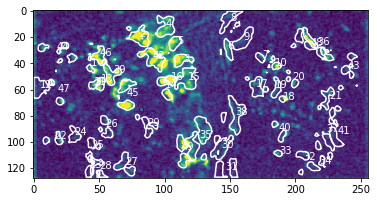

In [79]:
# %% plot contours of found components
cnm.estimates.plot_contours(img=Cn)

## Re-run (seeded) CNMF  on the full Field of View  
You can re-run the CNMF algorithm seeded on just the selected components from the previous step. Be careful, because components rejected on the previous step will not be recovered here.

In [80]:
%%capture
# RE-RUN seeded CNMF on accepted patches to refine and perform deconvolution
cnm2 = cnm.refit(images, dview=dview)

## Component Evaluation

The processing in patches creates several spurious components. These are filtered out by evaluating each component using three different criteria:

- the shape of each component must be correlated with the data at the corresponding location within the FOV
- a minimum peak SNR is required over the length of a transient
- each shape passes a CNN based classifier

<img src="https://raw.githubusercontent.com/flatironinstitute/CaImAn/master/docs/img/evaluationcomponent.png"/>

In [81]:
# COMPONENT EVALUATION
# the components are evaluated in three ways:
#   a) the shape of each component must be correlated with the data
#   b) a minimum peak SNR is required over the length of a transient
#   c) each shape passes a CNN based classifier
min_SNR = 2  # signal to noise ratio for accepting a component
rval_thr = 0.85  # space correlation threshold for accepting a component
cnn_thr = 0.99  # threshold for CNN based classifier
cnn_lowest = 0.1 # neurons with cnn probability lower than this value are rejected

cnm2.params.set('quality', {'decay_time': decay_time,
                            'min_SNR': min_SNR,
                            'rval_thr': rval_thr,
                            'use_cnn': True,
                            'min_cnn_thr': cnn_thr,
                            'cnn_lowest': cnn_lowest})

cnm2.estimates.evaluate_components(images, cnm2.params, dview=dview)


USING MODEL:/root/caiman_data/model/cnn_model.json
2/2 [==============================] - 1s 61ms/step


Plot contours of selected and rejected components

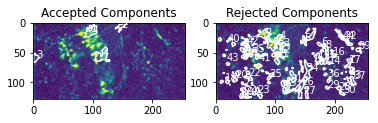

In [82]:
#%% PLOT COMPONENTS
cnm2.estimates.plot_contours(img=Cn, idx=cnm2.estimates.idx_components)

View traces of accepted and rejected components. Note that if you get data rate error you can start Jupyter notebooks using:
'jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10'

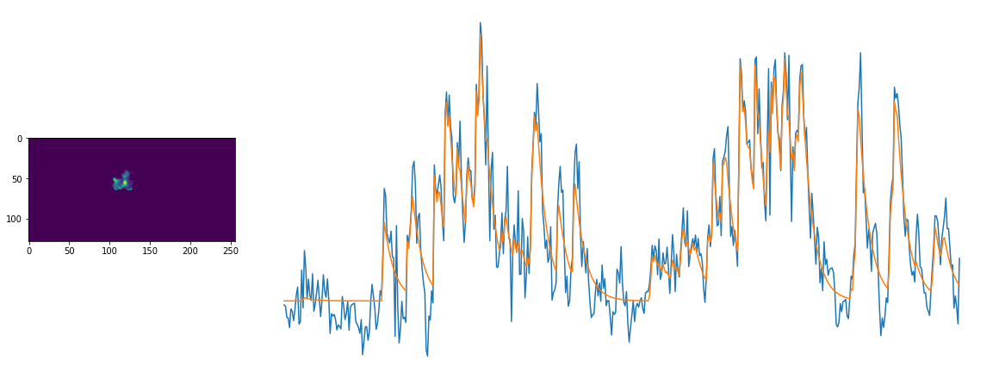

In [83]:
plot_results(cnm2) 

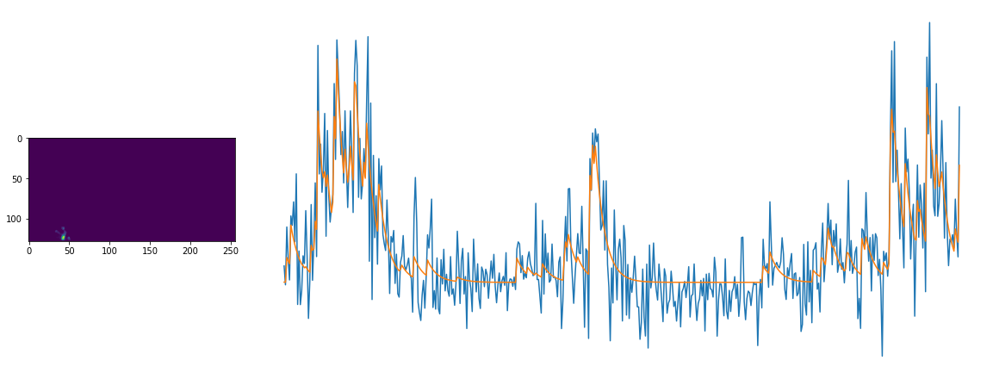

In [84]:
# rejected components
if len(cnm2.estimates.idx_components_bad) > 0:
    plot_results(cnm2, indexes=cnm2.estimates.idx_components_bad)
else:
    print("No components were rejected.")

### Extract DF/F values

In [85]:
#%% Extract DF/F values
cnm2.estimates.detrend_df_f(quantileMin=8, frames_window=250)

### Select only high quality components

In [86]:
cnm2.estimates.select_components(use_object=True)

## Display final results

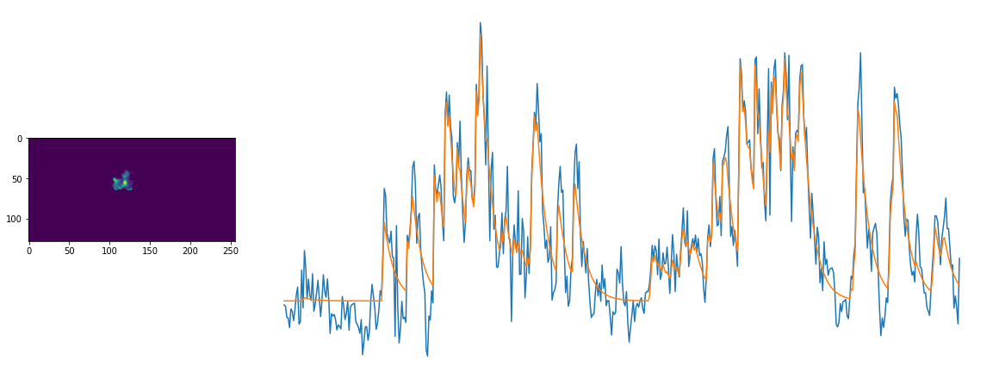

you may need to change the data rate to generate this one: use jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10 before opening jupyter notebook


In [87]:
#%matplotlib inline
plot_results(cnm2, indexes=range(cnm2.estimates.nr))
print('you may need to change the data rate to generate this one: use jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10 before opening jupyter notebook')

## Closing, saving, and creating denoised version
### You can save an hdf5 file with all the fields of the cnmf object

In [ ]:
save_results = True
#if save_results:
    #cnm2.save('analysis_results.hdf5')


### Stop cluster and clean up LOG files

In [88]:
#%% STOP CLUSTER and clean up log files
cm.stop_server(dview=dview)
log_files = glob.glob('*_LOG_*')
for log_file in log_files:
    os.remove(log_file)

### View movie with the results
We can inspect the denoised results by reconstructing the movie and playing alongside the original data and the resulting (amplified) residual movie. *The* denoised movie can be explicitly constructed using:

In [89]:
#%% reconstruct denoised movie
# moviehandle = cm.movie(cnm2.estimates.A.dot(cnm2.estimates.C) + \
#                     cnm2.estimates.b.dot(cnm2.estimates.f)).reshape(dims + (-1,), order='F').transpose([2, 0, 1])
moviehandle = cm.movie(cnm2.estimates.A.dot(cnm2.estimates.C)).reshape(dims + (-1,), order='F').transpose([2, 0, 1])
min_, max_ = np.percentile(moviehandle, 0.1), np.percentile(moviehandle, 99.9)
moviehandle = np.array(np.maximum(0,np.minimum((moviehandle-min_)/(max_-min_)*255,255))).astype(np.uint8)
imageio.mimwrite('/root/caiman_data/demo_movie_denoised.mp4', moviehandle, fps = 30,  quality=7)  
mp4 = open('/root/caiman_data/demo_movie_denoised.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)                  